# Customer Churn Prediction Using Long Short-Term Memory (LSTM) neural network model

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import pandas as pd
from collections import Counter
from tqdm import tqdm

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
from scipy import stats
import math
from math import sqrt
import sys


from scipy.stats import pearsonr

import category_encoders as ce
# Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve, f1_score, recall_score


from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.tree import export_graphviz
from six import StringIO 
import IPython, graphviz
from IPython.display import Image  
from sklearn.tree import export_graphviz
# import pydotplus
import re

#from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
import json

plt.style.use('seaborn-dark-palette')
plt.rcParams["figure.figsize"] = [16, 8]

width = 1000
height = 750

bg_color = '#FFFFFF'
paper_bg = '#FFFFFF'

plt.rcParams.update({'font.size': 18})
color_charts = '#2baae2'
plt.style.use('ggplot')
color = '#16171f'
plt.rcParams['text.color'] = color
plt.rcParams['axes.labelcolor'] = color
plt.rcParams['xtick.color'] = color
plt.rcParams['ytick.color'] = color

plt.rcParams.update({'text.color' : color,
                             'axes.labelcolor' : color})

plt.rcParams.update({'font.size': 17})
plt.rc('font', size=17)

from sklearn.metrics import precision_recall_curve, auc

from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,ConfusionMatrixDisplay


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve, f1_score, recall_score
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense
from tensorflow.keras.layers import Dense, LSTM, Dropout
from ydata_profiling import ProfileReport

from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.inspection import permutation_importance
from sklearn.metrics import balanced_accuracy_score

/var/folders/kk/qgfc3nnj2y7_cm8bjkqc3yrr0000gn/T/ipykernel_18386/1025619737.py:42: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


In [4]:
class pipeline_churn_prediction():
    def __init__(self):
        self.project = 'churn prediction '
        
    def get_percent_missing(self, df):
        percent_missing = df.isnull().sum() * 100 / len(df)
        missing_value_df = pd.DataFrame({'column_name': df.columns,
                                             'percent_missing': percent_missing})
        missing_value_df.sort_values('percent_missing', inplace=True)
        percent_missing = df.isnull().sum() * 100 / len(df)
        
        print('Percentage of Missing Values: ')

        return percent_missing

In [8]:
plt.rcParams["figure.figsize"] = [16, 8]
pipeline_churn_diego = pipeline_churn_prediction()

df_train = pd.read_csv('/Users/oreayomiposivictoriabajela/Documents/train.csv')
print(df_train.shape[0])
print(len(df_train.columns.tolist()))
df_train.head(1)

4250
20


,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,no


In [9]:
# Check the missing values 
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [10]:
pipeline_churn_diego.get_percent_missing(df_train)

Percentage of Missing Values: 


state                            0.0
account_length                   0.0
area_code                        0.0
international_plan               0.0
voice_mail_plan                  0.0
number_vmail_messages            0.0
total_day_minutes                0.0
total_day_calls                  0.0
total_day_charge                 0.0
total_eve_minutes                0.0
total_eve_calls                  0.0
total_eve_charge                 0.0
total_night_minutes              0.0
total_night_calls                0.0
total_night_charge               0.0
total_intl_minutes               0.0
total_intl_calls                 0.0
total_intl_charge                0.0
number_customer_service_calls    0.0
churn                            0.0
dtype: float64

In [11]:
# Displayy the first few rows
df_train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [13]:
df_test = pd.read_csv('/Users/oreayomiposivictoriabajela/Documents/test.csv')
print('Train shape {}'.format(df_train.shape))
print('Test shape {}'.format(df_test.shape))

# Check the missing values 

df_train.info()

Train shape (4250, 20)
Test shape (750, 20)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  tota

In [14]:
# Describe the string data
df_train.describe(include='O')

,state,area_code,international_plan,voice_mail_plan,churn
count,4250,4250,4250,4250,4250
unique,51,3,2,2,2
top,WV,area_code_415,no,no,no
freq,139,2108,3854,3138,3652


## Clean data

In [21]:
print(df_train.columns)

Index(['account_length', 'international_plan', 'voice_mail_plan',
       'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
       'total_day_charge', 'total_eve_minutes', 'total_eve_calls',
       'total_eve_charge', 'total_night_minutes', 'total_night_calls',
       'total_night_charge', 'total_intl_minutes', 'total_intl_calls',
       'total_intl_charge', 'number_customer_service_calls', 'churn'],
      dtype='object')


In [22]:
df_train['voice_mail_plan'] = df_train['voice_mail_plan'].astype(str).str.strip()
df_train['international_plan'] = df_train['international_plan'].astype(str).str.strip()
df_train['churn'] = df_train['churn'].astype(str).str.strip()


df_train = df_train.replace('yes', 1)
df_train = df_train.replace('no', 0)



In [27]:
df_test['voice_mail_plan'] = df_test['voice_mail_plan'].astype(str).str.strip()
df_test['international_plan'] = df_test['international_plan'].astype(str).str.strip()

df_test = df_test.replace('yes', 1)
df_test = df_test.replace('no', 0)


id_sub = df_test.id

df_test_ = df_test.drop(df_test.columns[0],axis=1)
df_test_

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,118,1,0,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0
2,62,0,0,0,120.7,70,20.52,307.2,76,26.11,203.0,99,9.14,13.1,6,3.54,4
3,93,0,0,0,190.7,114,32.42,218.2,111,18.55,129.6,121,5.83,8.1,3,2.19,3
4,174,0,0,0,124.3,76,21.13,277.1,112,23.55,250.7,115,11.28,15.5,5,4.19,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,130,0,0,0,119.4,99,20.30,226.3,97,19.24,202.7,111,9.12,11.3,7,3.05,0
746,73,0,0,0,177.2,118,30.12,270.5,84,22.99,241.8,112,10.88,12.3,2,3.32,3
747,152,0,0,0,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,14.7,2,3.97,3
748,61,0,0,0,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,13.6,4,3.67,1


##  Exploratory Data Analysis. 

In [28]:
profile = ProfileReport(df_train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
df_train.head(1)

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,0


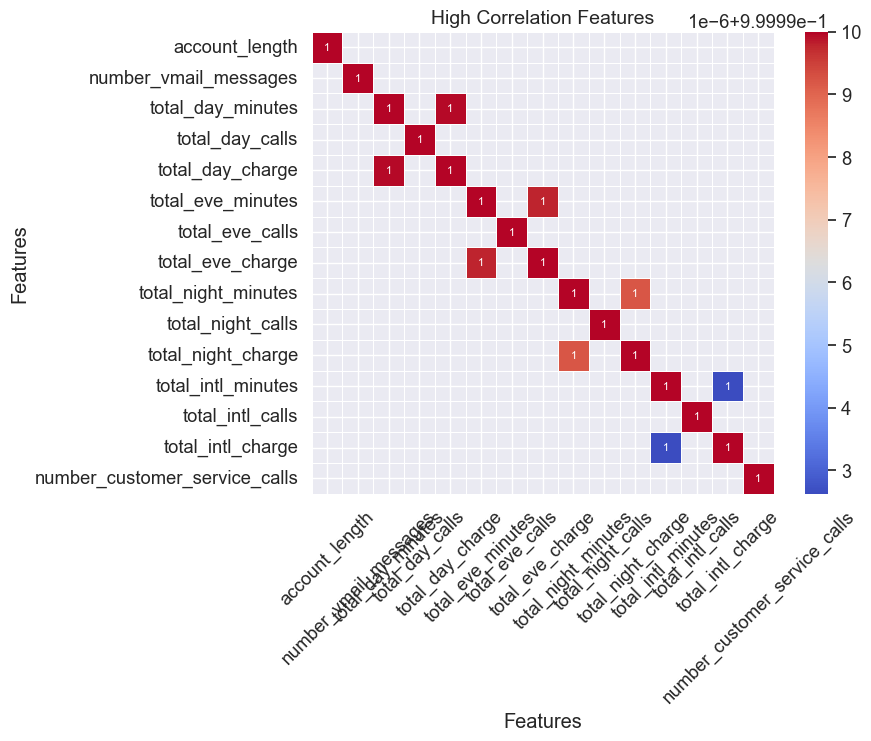

In [33]:
# calculate correlation and select those with high correlation values
corr = df_train.corr()
high_corr = corr[abs(corr) > 0.6]

# Generate a heatmap 
sb.set(font_scale=1.2)
fig, ax = plt.subplots(figsize=(8, 6))
sb.heatmap(high_corr, annot=True, annot_kws={"size": 8}, cmap='coolwarm', linewidths=.5, cbar=True, square=True, ax=ax)
ax.set_title('High Correlation Features', fontsize=14)
ax.set_xlabel('Features')
ax.set_ylabel('Features')
ax.tick_params(axis='x', labelrotation=45)
plt.show()

In [49]:
df_train['number_vmail_messages'] = pd.to_numeric(df_train['number_vmail_messages'], errors='coerce')
df_train['voice_mail_plan'] = pd.to_numeric(df_train['voice_mail_plan'], errors='coerce')
df_train['international_plan'] = pd.to_numeric(df_train['international_plan'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')
#df_train['target_column'] = pd.to_numeric(df_train['target_column'], errors='coerce')

# Handle missing values 
df_train = df_train.dropna(subset=['number_vmail_messages', 'voice_mail_plan'])

# Calculate Pearson correlation coefficient
correlation_coefficient, _ = pearsonr(df_train['number_vmail_messages'], df_train['voice_mail_plan'])

print(correlation_coefficient)

0.9540138631356972


### Long short term model

In [50]:
# Define the function to create the LSTM model outside the class
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, input_shape=input_shape, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(32))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

#LSTMClassifier class
class LSTMClassifier:
""""
    
   The LSTMClassifier class offers a user-friendly interface to facilitate the 
   training, assessment, and optimization of Long Short-Term Memory (LSTM) models 
   specifically designed for binary classification purposes.

   Within this class, there are functions for data preprocessing, construction and training 
   of the LSTM model, model evaluation through diverse metrics, visualization of training 
   history and ROC curve, prediction of new instances, as well as saving/loading the model.
   Additionally, it enables the extraction of feature importances using permutation importance.
   The class also supports hyperparameter tuning, K-fold cross-validation, and early stopping.
    
  Sample usage:
    --------------
    
    # Initialize the LSTMClassifier with your data
    lstm_classifier = LSTMClassifier(data)
    
    # Preprocess the data
    lstm_classifier.preprocess_data()
    
    # Build the LSTM model
    lstm_classifier.build_model()
    
    # Train the model
    history = lstm_classifier.train_model(epochs=50, batch_size=32)
    
    # Evaluate the model
    lstm_classifier.evaluate_model()
    
    # Plot the training history and ROC curve
    lstm_classifier.plot_training_history(history)
    lstm_classifier.plot_roc_curve()
    
    # Predict new instances
    y_pred = lstm_classifier.predict(X_new)
    
    """
    
    def __init__(self, data):
        # Initialize the data path and variables to store the data, train and test sets, and model
        # self.data_path = data_path
        self.data = data
        self.X_train = None
        self.X_test = None
        self.y_train = None
        self.y_test = None
        self.scaler = None
        self.model = None
        
    def load_data(self):
        # Load the data from the specified path
        self.data = pd.read_csv(self.data_path)
        
    def preprocess_data(self):
        # Split the data into features (X) and target (y)
        X = self.data.drop(["churn"], axis=1)
        y = self.data["churn"]
        
        # Split the data into train and test sets
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
        # Standardize the features
        self.scaler = StandardScaler()
        self.X_train = self.scaler.fit_transform(self.X_train)
        self.X_test = self.scaler.transform(self.X_test)
        
        # Reshape the features to be 3D arrays suitable for input into an LSTM model
        self.X_train = np.reshape(self.X_train, (self.X_train.shape[0], 1, self.X_train.shape[1]))
        self.X_test = np.reshape(self.X_test, (self.X_test.shape[0], 1, self.X_test.shape[1]))
        
    def build_model(self):
        # Create a sequential model with two LSTM layers, two dropout layers, and a dense output layer
        self.model = Sequential()
        self.model.add(LSTM(64, input_shape=(1, self.X_train.shape[2]), return_sequences=True))
        self.model.add(Dropout(0.2))
        self.model.add(LSTM(32))
        self.model.add(Dropout(0.2))
        self.model.add(Dense(1, activation='sigmoid'))
        # Compile the model with the binary crossentropy loss function, the Adam optimizer, and accuracy metrics
        self.model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
        
    def early_stopping(self, patience=10, restore_best_weights=True):
        return EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=restore_best_weights)
    
    def custom_metric(self, y_true, y_pred):
        # Example: Implement the balanced accuracy metric
        balanced_accuracy = balanced_accuracy_score(y_true, y_pred)
        return balanced_accuracy
    
        
    def evaluate_model(self, use_custom_metric=True):
        y_pred_prob = self.model.predict(self.X_test)
        y_pred_rounded = np.round(y_pred_prob)
        y_pred = y_pred_rounded.astype(int).ravel()

        # Evaluation metrics
        confusion_mat = confusion_matrix(self.y_test, y_pred)
        classification_re = classification_report(self.y_test, y_pred)
        accuracy = accuracy_score(self.y_test, y_pred)
        f1 = f1_score(self.y_test, y_pred)
        recall = recall_score(self.y_test, y_pred)

        # Print the evaluation metrics
        print("Confusion Matrix:")
        print(confusion_mat)
        print("Classification Report:")
        print(classification_re)
        print("Accuracy:", accuracy)
        print("F1 Score:", f1)
        print("Recall:", recall)

        if use_custom_metric:
            custom_metric_value = self.custom_metric(self.y_test, y_pred)
            print("Custom Metric Value (Balanced Accuracy):", custom_metric_value)
        
    def plot_training_history(self, history):
        # Plot training & validation accuracy values
        plt.figure(figsize=(12, 5))
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Test'], loc='upper left')
        plt.show()

        # Plot training & validation loss values
        plt.figure(figsize=(12, 5))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Test'], loc='upper left')
        plt.show()

    def plot_roc_curve(self):
        y_pred_prob = self.model.predict(self.X_test).ravel()
        fpr, tpr, thresholds = roc_curve(self.y_test, y_pred_prob)
        auc_score = auc(fpr, tpr)

        plt.figure(figsize=(10, 6))
        plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC)')
        plt.legend(loc="lower right")
        plt.show()
        
    def predict(self, X):
        # Preprocess input
        X_scaled = self.scaler.transform(X)
        X_reshaped = np.reshape(X_scaled, (X_scaled.shape[0], 1, X_scaled.shape[1]))
        
        # Make predictions
        y_pred_prob = self.model.predict(X_reshaped)
        y_pred_rounded = np.round(y_pred_prob)
        y_pred = y_pred_rounded.astype(int).ravel()
        return y_pred

    def save_model(self, model_path):
        self.model.save(model_path)

    def load_model(self, model_path):
        self.model = load_model(model_path)

    def get_model_summary(self):
        self.model.summary()
        
    def tune_hyperparameters(self, param_grid, cv=5, search_type='grid', n_iter=None, random_state=42):
        input_shape = (1, self.X_train.shape[2])

        # Wrap the model for use with scikit-learn
        model = KerasClassifier(build_fn=lambda: create_lstm_model(input_shape), verbose=0)

        if search_type == 'grid':
            search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        elif search_type == 'random':
            if n_iter is None:
                raise ValueError("n_iter must be specified for random search.")
            search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=cv,
                                        n_iter=n_iter, random_state=random_state)

        search_result = search.fit(self.X_train, self.y_train)

        # Print the best score and best parameters
        print("Best score: %f using %s" % (search_result.best_score_, search_result.best_params_))
        return search_result

    def k_fold_cross_validation(self, n_splits=5, epochs=50, batch_size=32):
        input_shape = (1, self.X_train.shape[2])

        # Define a function to create the model with the proper input shape
        def create_model():
            return create_lstm_model(input_shape)

        # Wrap the model for use with scikit-learn
        model = KerasClassifier(build_fn=create_model, epochs=epochs, batch_size=batch_size, verbose=0)

        # Perform k-fold cross-validation
        kfold = KFold(n_splits=n_splits, shuffle=True, random_state=42)
        results = cross_val_score(model, self.X_train, self.y_train, cv=kfold)

        # Print the mean and standard deviation of the cross-validation scores
        print("Cross-Validation Accuracy: %.2f%% (%.2f%%)" % (results.mean() * 100, results.std() * 100))

    def model_to_json(self):
        model_json = self.model.to_json()
        return model_json

    def json_to_model(self, model_json):
        self.model = model_from_json(model_json)
        
    def predict_proba(self, X):
        X_scaled = self.scaler.transform(X)
        X_reshaped = np.reshape(X_scaled, (X_scaled.shape[0], 1, X_scaled.shape[1]))
        y_pred_prob = self.model.predict(X_reshaped)
        return y_pred_prob

    def train_val_split(self, val_size=0.1, random_state=42):
        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(
            self.X_train, self.y_train, test_size=val_size, random_state=random_state)

        # Reshape X_val using the same number of features as in X_train and X_test
        self.X_val = np.reshape(self.X_val, (self.X_val.shape[0], 1, self.X_train.shape[2]))


    def learning_rate_reduction(self, factor=0.1, patience=10, min_lr=1e-5):
        return ReduceLROnPlateau(monitor='val_loss', factor=factor, patience=patience, min_lr=min_lr)

    def train_model(self, epochs, batch_size, use_early_stopping=True, use_lr_reduction=True):
        callbacks = []
        if use_early_stopping:
            callbacks.append(self.early_stopping())
        if use_lr_reduction:
            callbacks.append(self.learning_rate_reduction())

        history = self.model.fit(self.X_train, self.y_train, epochs=epochs, batch_size=batch_size,
                                 validation_data=(self.X_test, self.y_test), callbacks=callbacks)
        return history
    
    def get_feature_importance(self, X, y, n_repeats=10, random_state=42):
        # Wrap the predict_proba method for use with sklearn's permutation_importance function
        def predict_proba_wrapped(X):
            return self.predict_proba(X)

        # Compute the permutation importance
        result = permutation_importance(predict_proba_wrapped, X, y, n_repeats=n_repeats,
                                        random_state=random_state, n_jobs=-1)

        # Combine the feature importances and their names into a dataframe and sort by importance
        feature_importance = pd.DataFrame({'feature': self.data.drop(["churn"], axis=1).columns,
                                           'importance': result.importances_mean,
                                           'std': result.importances_std})

        feature_importance = feature_importance.sort_values(by='importance', ascending=False)

        return feature_importance

### Now Train

In [53]:
# Assuming y_train and y_test are your target variables
print("Unique values in y_train:", df_train.unique())
print("Unique values in y_test:", df_test.unique())


AttributeError: 'DataFrame' object has no attribute 'unique'

In [51]:


# Instantiate the LSTMClassifier
lstm_classifier = LSTMClassifier(df_train)

# Preprocess the data
lstm_classifier.preprocess_data()

# Split the training data into training and validation sets
lstm_classifier.train_val_split()

# Build the model
lstm_classifier.build_model()

# Train the model with early stopping and learning rate reduction
history = lstm_classifier.train_model(epochs=1000, batch_size=64)

Epoch 1/1000


2024-01-17 16:20:28.224586: W tensorflow/core/framework/op_kernel.cc:1816] OP_REQUIRES failed at cast_op.cc:122 : UNIMPLEMENTED: Cast string to float is not supported


UnimplementedError: Graph execution error:

Detected at node binary_crossentropy/Cast defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel_launcher.py", line 17, in <module>

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 711, in start

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/tornado/platform/asyncio.py", line 195, in start

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/asyncio/base_events.py", line 607, in run_forever

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/asyncio/base_events.py", line 1922, in _run_once

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 729, in execute_request

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 411, in do_execute

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/ipykernel/zmqshell.py", line 531, in run_cell

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3006, in run_cell

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3061, in _run_cell

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3266, in run_cell_async

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3445, in run_ast_nodes

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3505, in run_code

  File "/var/folders/kk/qgfc3nnj2y7_cm8bjkqc3yrr0000gn/T/ipykernel_18386/3612304349.py", line 14, in <module>

  File "/var/folders/kk/qgfc3nnj2y7_cm8bjkqc3yrr0000gn/T/ipykernel_18386/961930668.py", line 257, in train_model

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1807, in fit

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call

  File "/Users/oreayomiposivictoriabajela/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 2521, in binary_crossentropy

Cast string to float is not supported
	 [[{{node binary_crossentropy/Cast}}]] [Op:__inference_train_function_17173]

In [ ]:
# Tune hyperparameters
param_grid = {
    'epochs': [25, 50],
    'batch_size': [32, 64]
}

# grid_result = lstm_classifier.tune_hyperparameters(param_grid)

# Perform k-fold cross-validation
# lstm_classifier.k_fold_cross_validation(n_splits=5, epochs=50, batch_size=32)

## Evaluate the model

In [ ]:
# Plot the training history
lstm_classifier.plot_training_history(history)

In [ ]:
# Evaluate the model
lstm_classifier.evaluate_model()

In [ ]:
# Plot the ROC curve
lstm_classifier.plot_roc_curve()

## Now use the model to predict

In [ ]:
## visualise top
df_test.head(1)

In [ ]:
y_pred_prob = lstm_classifier.predict_proba(df_test_)
predicted = lstm_classifier.predict(df_test_)

In [ ]:
final_table = pd.DataFrame({'id':id_sub, 'churn':predicted})
final_table.head(5)

In [ ]:
final_table
final_table.to_csv('submission.csv',index=False)

### Which features are most important?

In [ ]:
 # Get feature importances
feature_importances = lstm_classifier.get_feature_importance(X_test, y_test)

# Print the feature importances
print("Feature importances:")
print(feature_importances)

In [ ]:
# Save the model to disk
classifier.save_model('lstm_model.h5')

# Load the model from disk
classifier.load_model('lstm_model.h5')

# Save the model architecture as a JSON string
lstm_model = classifier.model_to_json()

# Load the model architecture from a JSON string
classifier.json_to_model(lstm_model)

# Print the model architecture summary
classifier.get_model_summary()